# Исследование рынка заведений общественного питания Москвы

***Описание данных***

   **Файл moscow_places.csv:**
   
Путь к файлу: /datasets/moscow_places.csv
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
     - «Средний счёт: 1000–1500 ₽»;
     - «Цена чашки капучино: 130–220 ₽»;
     - «Цена бокала пива: 400–600 ₽».
     - и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
   - 0 — заведение не является сетевым
   - 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

**Ход исследования:**

Для начала работы получим данные из CSV-файла: ознакомимся с данными и при необходимости подкорректируем (подготовим к дальнейшему анализу). После проведём исследовательский анализ данных и ответим на важные вопросы исследования, далее детализируем исследование: посмотрим на перспективу открытия кофейни, затем подготовим презентацию нашей работы. Каждый этап подразумевает выполнение списка определённых задач, необходимых для достижения результата.
Таким образом, моё исследование проекта пройдёт в 5 этапов:

**Оглавление:**

1. [Загрузите данные и изучите общую информацию](#1)
2. [Выполните предобработку данных](#2)
    * [Создайте столбец street с названиями улиц из столбца с адресом.](#21)
    * [Создайте столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)](#22)
3. [Анализ данных](#3)
    * [Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.](#31)
    * [Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.](#32)
    * [Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?](#33)
    * [Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.](#34)
    * [Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?](#35)
    * [Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.](#36)
    * [Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?](#37)
    * [Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).](#38)
    * [Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.](#39)
    * [Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.](#40)
    * [Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?](#41)
    * [Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?](#42)
    * [Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.](#43)
    * [Соберите наблюдения по вопросам выше в один общий вывод.](#44)
4. [Детализируем исследование: открытие кофейни](#5)
    * [Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?](#51)
    * [Есть ли круглосуточные кофейни?](#52)
    * [Какие у кофеен рейтинги? Как они распределяются по районам?](#53)
    * [На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?](#54)
5. [Подготовка презентации](#6)

## Загрузите данные и изучите общую информацию
<a id="1"></a>

Импортируем библиотеки для проведения работы

In [1]:
import pandas as pd

import warnings
warnings.filterwarnings("ignore")

import datetime as dt

import numpy as np

import matplotlib.pyplot as plt

import scipy.stats as stats

from plotly import graph_objects as go

import seaborn as sns

import plotly.express as px

from numpy import median

from folium import Map, Marker, Choropleth
# импортируем кластер
from folium.plugins import MarkerCluster

import random

Записываем данные в переменную для дальшейшей работы

In [2]:
try:
    places = pd.read_csv('/datasets/moscow_places.csv') 
except:
    places = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

Знакомимся с данными

In [3]:
display(places[:10])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


Первостепенно обращаем внимание на корректность чтения и названия атрибутов: файл прочитался адекватно (датафрейм имеет структуру согласно документации, а наименования в ячейках понятны для восприятия), названия атрибутов приведены к единому стилю, есть пропуски.

Ознакомимся с каждым столбцом датафрейма:

Атрибут name имеет слишком большую вариативность: хранит количественные значения или категорий слишком много.
----------------------------------------------------------------------------------------------------------
Атрибут: category
Количество уникальных значений: 8
Уникальные значения: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


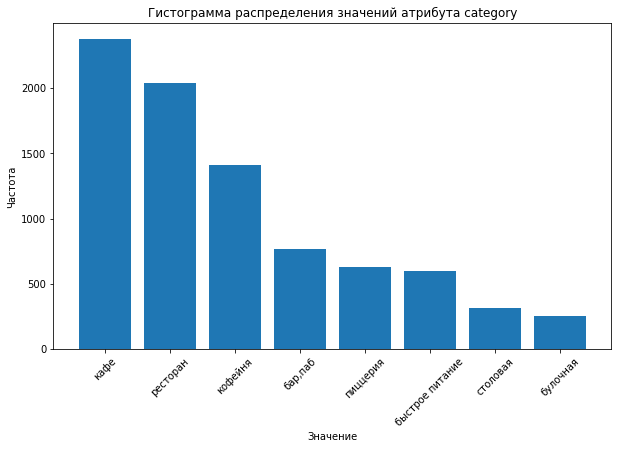

----------------------------------------------------------------------------------------------------------
Атрибут address имеет слишком большую вариативность: хранит количественные значения или категорий слишком много.
----------------------------------------------------------------------------------------------------------
Атрибут: district
Количество уникальных значений: 9
Уникальные значения: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


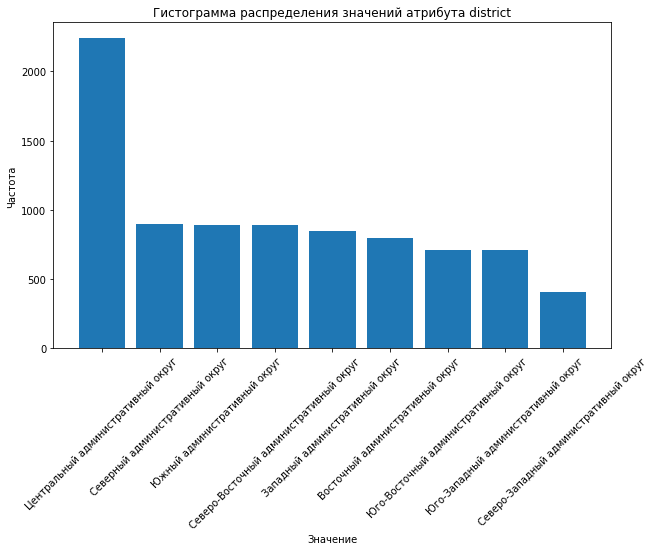

----------------------------------------------------------------------------------------------------------
Атрибут hours имеет слишком большую вариативность: хранит количественные значения или категорий слишком много.
----------------------------------------------------------------------------------------------------------
Атрибут lat имеет слишком большую вариативность: хранит количественные значения или категорий слишком много.
----------------------------------------------------------------------------------------------------------
Атрибут lng имеет слишком большую вариативность: хранит количественные значения или категорий слишком много.
----------------------------------------------------------------------------------------------------------
Атрибут rating имеет слишком большую вариативность: хранит количественные значения или категорий слишком много.
----------------------------------------------------------------------------------------------------------
Атрибут: price
Количеств

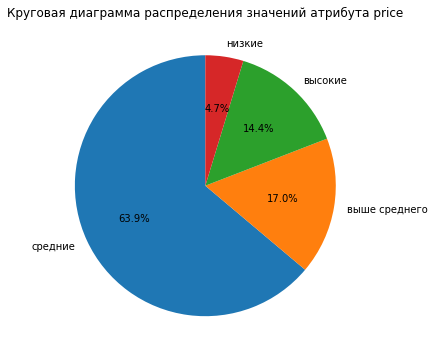

----------------------------------------------------------------------------------------------------------
Атрибут avg_bill имеет слишком большую вариативность: хранит количественные значения или категорий слишком много.
----------------------------------------------------------------------------------------------------------
Атрибут middle_avg_bill имеет слишком большую вариативность: хранит количественные значения или категорий слишком много.
----------------------------------------------------------------------------------------------------------
Атрибут middle_coffee_cup имеет слишком большую вариативность: хранит количественные значения или категорий слишком много.
----------------------------------------------------------------------------------------------------------
Атрибут: chain
Количество уникальных значений: 2
Уникальные значения: [0 1]


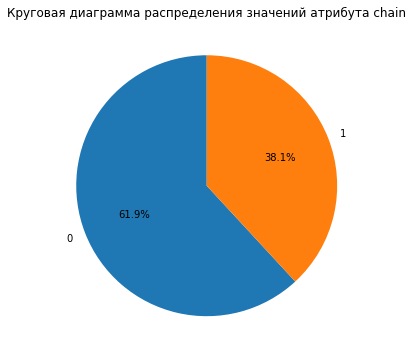

----------------------------------------------------------------------------------------------------------
Атрибут seats имеет слишком большую вариативность: хранит количественные значения или категорий слишком много.
----------------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   

In [4]:

def plot_distribution(df):
    """
    Функция для построения диаграмм распределения значений в DataFrame.

    df: DataFrame, для которого необходимо построить диаграммы.
    """
    for col_name in df.columns:
        len_uniq_values = len(df[col_name].unique())
        
        if len_uniq_values <= 20:
            print(f'Атрибут: {col_name}')
            print(f'Количество уникальных значений: {len_uniq_values}')
            print(f'Уникальные значения: {df[col_name].unique()}')

        if len_uniq_values <= 6:
            plt.figure(figsize=(10, 6))
            value_counts = df[col_name].value_counts()
            plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=90)  
            plt.title(f'Круговая диаграмма распределения значений атрибута {col_name}')
            plt.show()

        elif 7 <= len_uniq_values <= 20:
            plt.figure(figsize=(10, 6))
            value_counts = df[col_name].value_counts()
            plt.bar(value_counts.index, value_counts)
            plt.title(f'Гистограмма распределения значений атрибута {col_name}')
            plt.xlabel('Значение')  
            plt.ylabel('Частота')  
            plt.xticks(rotation=45)  # Поворачиваем метки оси X
            plt.show()

        else:
            print(f'Атрибут {col_name} имеет слишком большую вариативность: хранит количественные значения или категорий слишком много.')

        print('----------------------------------------------------------------------------------------------------------')
        
    df.info()

plot_distribution(places)

- name — название заведения: тип - object, уникальных значений более 20-и, корректный тип данных для категориальных данных;
- address — адрес заведения: тип - object, уникальных значений более 20-и, корректный тип данных для категориальных данных;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»: всего 8 возможных категорий: тройка лидеров следующая: кафе, ресторан, кофейня. Корректный тип данных для категорий. Тип - object.
- hours — информация о днях и часах работы: корректный тип данных(тип - object), т.к. несёт помимо времении информацию о регулярности.
- lat — широта географической точки, в которой находится заведение: корректный тип данных для гео. точки - float64, количественные данные;
- lng — долгота географической точки, в которой находится заведение: корректный тип данных для гео. точки - float64, количественные данные;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0): корректный тип данных - float64, количественные данные;
- price — категория цен в заведении, доли располагаются следующим образом(по убыванию) «средние», «выше среднего», «высокие», «низкие», корректный тип данных - object;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
     - «Средний счёт: 1000–1500 ₽»;
     - «Цена чашки капучино: 130–220 ₽»;
     - «Цена бокала пива: 400–600 ₽».
     - и так далее, корректный тип данных - object;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт, корректный тип данных - object.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт, корректный тип данных - object;
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
   - 0 — заведение не является сетевым
   - 1 — заведение является сетевым, корректный тип данных - булевый, нужно поменять;
- district — административный район, в котором находится заведение, корректный тип данных - object: всего 9 районов, где лидирует Центральный административный округ с отрывом более чем в 2 раза от 2-й позиции;
- seats — количество посадочных мест, корректный тип данных - int, необходимо заменить тип.

В 2-х столбцах необходимо заменить тип: seats и chain.

Более детально ознакомимся с данными, используя функцию которая покажет нам количество и долю дубликатов:

In [5]:
def duplicated_sum(dataframes, names):
    for frame, name in zip(dataframes, names):
        duplicated_count = frame.duplicated().sum()
        print(f'\033[1m' + 'Количество дубликатов в таблице ' + name + ':' + '\033[0m', duplicated_count)
        temp = frame.copy()
        list_c = list(temp.columns)
        for col_l in list_c:
            print(col_l,': кол-во NaN',temp[col_l].isna().sum(),
                  ', процент NaN', round(temp[col_l].isna().mean()*100,2),'%')
            print('-'* 25)
        display(pd.DataFrame(round(frame.isna().mean()*100,)).style.background_gradient('coolwarm'))
        display(frame.info())
        display(frame.head(5))
        print()

duplicated_sum([places], ['places'])

Количество дубликатов в таблице places: 0
name : кол-во NaN 0 , процент NaN 0.0 %
-------------------------
category : кол-во NaN 0 , процент NaN 0.0 %
-------------------------
address : кол-во NaN 0 , процент NaN 0.0 %
-------------------------
district : кол-во NaN 0 , процент NaN 0.0 %
-------------------------
hours : кол-во NaN 536 , процент NaN 6.38 %
-------------------------
lat : кол-во NaN 0 , процент NaN 0.0 %
-------------------------
lng : кол-во NaN 0 , процент NaN 0.0 %
-------------------------
rating : кол-во NaN 0 , процент NaN 0.0 %
-------------------------
price : кол-во NaN 5091 , процент NaN 60.56 %
-------------------------
avg_bill : кол-во NaN 4590 , процент NaN 54.6 %
-------------------------
middle_avg_bill : кол-во NaN 5257 , процент NaN 62.54 %
-------------------------
middle_coffee_cup : кол-во NaN 7871 , процент NaN 93.64 %
-------------------------
chain : кол-во NaN 0 , процент NaN 0.0 %
-------------------------
seats : кол-во NaN 3611 , процент Na

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Скрипт помог нам установить следующее:

- явные пропуски (NULL-значения) в нашем датафрейме наблюдаются в следующих столбцах:
  - 'hours' - 6%
  - 'price' - 61%
  - 'avg_bill' - 55%
  - 'middle_avg_bill' - 63%
  - 'middle_coffee_cup' - 94%
  - 'seats' - 43%
  (алгоритм работы с каждым таким атрибутом разберём и реализуем в следующем пункте)
- количество дубликатов в таблице places: 0;
- всего 8406 записи;
- типы данных определены корректно для столбцов;
- единый стиль(snake-case) соблюдён.

Явных дубликатов скрипт не обнаружил, но всё же стоит проверить дубликаты по атрибуту названия заведения:

In [6]:
places['name'].duplicated().sum()

2792

Названия заведений дублируются и это вполне предсказуемо: у нас имеются сетевые организации с идентичными названиями. Проверим дубликаты по атрибутам названия и адресов:

In [7]:
places[['name', 'address']].duplicated().sum()

0

Дубликатов по названию и адресу не найдено, значит всего 8406 заведения представлено.

In [8]:
gb_name = places.groupby('name')['name'].agg('count')
print(f'Всего сетевых организаций общественного питания: {gb_name.loc[gb_name > 1].count()}')
print(f'Всего единичных организаций общественного питания: {gb_name.loc[gb_name == 1].count()}')

Всего сетевых организаций общественного питания: 714
Всего единичных организаций общественного питания: 4900


**Промежуточный итог/итог 1-го пункта:** 

С датасетом ознакомление прошло успешно: всего 8406 записи/объекта/заведения общественного питания представлено, где:
- 4900 являются единичными представителями;
- 3506 являются частью сетей.

Дубликатов не обнаружено, единый стиль названий атрибутов присутствует, значения в полях согласно документации.

Недостатки следующие: значительное количество пропусков в 5 столбцах и небольшое в одном. Алгоритм работы с пропусками мы подберём и реализуем в следующем пункте. Некоторые столбцы немного избыточны: удалять мы их не будем, но добавим некоторые новые с более конкретными данными для простоты работы/пользования методами. Типы данных подобраны корректно(не ограничивают возможности библиотек для анализа), кроме 2-х столбцов, необходимо заменить тип в: seats и chain.

## Выполните предобработку данных
<a id="2"></a>

Явных дубликатов мы не обнаружили ещё на прошлом этапе. С пропусками необходимо  поработать: наличие пропусков является проблемой для изменения типов данных в некоторых столбцах, поэтому эта задача является первостепенной для решения.

Рассмотрим атрибут 'hours' (6% пропусков):

In [9]:
places[places['hours'].isna()].sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
870,Кафе,кафе,"Москва, Коровинское шоссе, 1А",Северный административный округ,NaN,55.864616,37.544888,4.1,NaN,NaN,NaN,NaN,0,45.0
4478,Untitled,кафе,"Москва, Яузский бульвар, 14/8",Центральный административный округ,NaN,55.750969,37.643473,4.5,средние,Средний счёт:1500–2000 ₽,1750.0,NaN,0,16.0
4315,Кафе,кафе,"Москва, 2-й Обыденский переулок, 8/8",Центральный административный округ,NaN,55.742326,37.603199,4.5,NaN,NaN,NaN,NaN,0,NaN
1163,Кофейня,кофейня,"Москва, проспект Мира, 119с71",Северо-Восточный административный округ,NaN,55.830040,37.633969,4.4,NaN,NaN,NaN,NaN,0,NaN
7363,Антон,кафе,"Москва, улица Верхние Поля, 56с11",Юго-Восточный административный округ,NaN,55.653705,37.821907,4.3,NaN,NaN,NaN,NaN,0,NaN


Восстановить данные в этом атрибуте не преставляется возможным: создадим 'заглушку':

In [10]:
places.loc[places['hours'].isna(), 'hours'] = places.loc[places['hours'].isna(), 'hours'].apply(lambda x: 'пусто')

Рассмотрим атрибут 'price' (61% пропусков):

In [11]:
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [12]:
places[places['price'].isna()].sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7680,Березка,"бар,паб","Москва, Дорожная улица, 42",Южный административный округ,"ежедневно, круглосуточно",55.588328,37.613314,1.1,NaN,NaN,NaN,NaN,0,30.0
8240,Ла Карот,столовая,"Москва, Варшавское шоссе, 47, корп. 4",Южный административный округ,пн-пт 09:00–18:00,55.679195,37.630367,4.9,NaN,NaN,NaN,NaN,0,92.0
761,Бульвар,"бар,паб","Москва, Бескудниковский бульвар, 40, корп. 3",Северный административный округ,пн-чт 12:00–07:00; пт 12:00–08:00; сб 14:00–08...,55.873923,37.551398,4.1,NaN,NaN,NaN,NaN,1,60.0
4475,1901 Comfort Food Zone,кафе,"Москва, Самокатная улица, 4, стр. 11",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.757106,37.675792,4.3,NaN,NaN,NaN,NaN,0,NaN
7775,Домашняя еда,кафе,"Москва, МКАД, 33-й километр, 6",Южный административный округ,пусто,55.578683,37.588743,4.2,NaN,NaN,NaN,NaN,1,NaN


Попробуем восстановить данные по смежным столбцам: выясним какой диапозон цен соотносится каждой вариации категории 'price':

In [13]:
places[(~places['price'].isna()) & (places['avg_bill'] != 'пусто') & (~places['avg_bill'].isna())].sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3810,Supernova,пиццерия,"Москва, Садовая-Каретная улица, 20с1",Центральный административный округ,"ежедневно, 12:00–23:00",55.772968,37.610448,4.6,средние,Средний счёт:650 ₽,650.0,NaN,0,NaN
3800,Остерия Марио,пиццерия,"Москва, Манежная площадь, 1, стр. 2",Центральный административный округ,"ежедневно, 10:00–22:00",55.756106,37.616017,4.4,средние,Средний счёт:700–1500 ₽,1100.0,NaN,0,150.0
6542,Florentini,ресторан,"Москва, улица Мичуринский Проспект, Олимпийска...",Западный административный округ,"пн-чт 11:00–23:30; пт,сб 11:00–00:00; вс 11:00...",55.675559,37.471417,4.7,высокие,Средний счёт:1500–2500 ₽,2000.0,NaN,1,150.0
4385,Beer & Brut,"бар,паб","Москва, улица Покровка, 26/1с2",Центральный административный округ,"ежедневно, 10:00–00:00",55.760126,37.649268,4.6,высокие,Средний счёт:1500–2500 ₽,2000.0,NaN,0,NaN
4172,Niki,ресторан,"Москва, Арбатская площадь, 14, стр. 1",Центральный административный округ,"ежедневно, 12:00–00:00",55.752379,37.602032,4.4,высокие,Средний счёт:2000–3500 ₽,2750.0,NaN,0,NaN


В avg_bill слишком большая вариативность. Нельзя однозначно полагаться на цифры в этом столбце: в 2-х записях может быть диапозон с 140 по 420 рублей, но при этом где-то будет стоимость бокала пива, а где-то средний счёт и категории будут также различны. Оставим пропуски в этом столбце, чтобы не вносить ещё больше путаницы.

Рассмотрим атрибут 'avg_bill' (55%), middle_avg_bill (63%), middle_coffee_cup (94%):

Здесь снова трудности в восстановлении данных, поэтому оставим как есть.

Рассмотрим атрибут 'seats' (43% пропусков):

In [14]:
places[places['seats'].isna()].sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8006,Чёрная пантера,кафе,"Москва, Измайловское шоссе, 71к4Г-Д",Восточный административный округ,"ежедневно, 09:00–23:00",55.791785,37.748662,3.7,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN
1128,ЛапшаWOK,кафе,"Москва, проспект Мира, 119, стр. 501",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.836063,37.626229,3.9,средние,Средний счёт:300–500 ₽,400.0,NaN,0,NaN
6030,Prawns,быстрое питание,"Москва, Воробьёвская набережная",Западный административный округ,"ежедневно, 10:00–22:00",55.711884,37.546112,4.2,средние,Средний счёт:600 ₽,600.0,NaN,0,NaN
3442,Cosmic latte,кофейня,"Москва, улица Заморёнова, 12, стр. 1",Центральный административный округ,"ежедневно, 08:00–22:00",55.759669,37.573474,4.4,NaN,NaN,NaN,NaN,1,NaN
6987,Drive Café,кафе,"Москва, улица Обручева, 42А",Юго-Западный административный округ,"ежедневно, круглосуточно",55.651971,37.546844,4.0,NaN,NaN,NaN,NaN,1,NaN


В этом атрибуте желательно изменить тип данных на целочисленный, поэтому создадим 'заглушку', обозначающую отсутствие данных: -1.

In [15]:
# замена
places.loc[places['seats'].isna(), 'seats'] = places.loc[places['seats'].isna(), 'seats'].apply(lambda x: -1)

Изменим типы данных в 'seats' и 'chain'.

Также заменим ячейки со значением 'пусто' на -1, т.к. в нашем слечае они обозначают одно и тоже(отсутствие данных).

In [16]:
places.loc[places['seats'] == 'пусто', 'seats'] = places.loc[places['seats'] == 'пусто', 'seats'].apply(lambda x: -1)

In [17]:
places['seats'] = places['seats'].astype('int')

In [18]:
places['chain'] = places['chain'].astype('bool')

In [19]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   bool   
 13  seats              8406 non-null   int64  
dtypes: bool(1), float64(5), int64(1), object(7)
memory usage: 862.1+ KB


Теперь все типы данных корректны подобраны для дальнейшей работы.

### Создайте столбец street с названиями улиц из столбца с адресом
<a id="21"></a>

Взглянем на структуру атрибута 'address':

In [20]:
places['address'].sample(5)

5274                 Москва, улица Бахрушина, 25
5067    Москва, 1-я Дубровская улица, 1, корп. 3
4859      Москва, Большой Факельный переулок, 12
2004             Москва, Огородный проезд, вл22А
1364                 Москва, Балтийская улица, 3
Name: address, dtype: object

Как видим до первой запятой указывется город, потом улица, потом номер дома: воспользуемся этим и выберем вторую подстроку (1-й индекс):

In [21]:
places['street'] = places['address'].str.split(',').str.get(1).str.strip()

In [22]:
places['street'].sample(10)

1157         Берёзовая аллея
3173       Филёвский бульвар
4367    Чистопрудный бульвар
2714      Щербаковская улица
7502      улица Мусы Джалиля
180        Дмитровское шоссе
5497              улица Лазо
6921         улица Бутлерова
1645     Тимирязевская улица
712        Дмитровское шоссе
Name: street, dtype: object

Данный подход корректно сработал, идём дальше.

### Создайте столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
<a id="22"></a>

In [23]:
# Создадим функцию для определения заведений которые работают 24_7
def bool_24_7_worktime(col):
    if 'ежедневно, круглосуточно' in col:
        return True
    else:
        return False

In [24]:
# Применим функцию к атрибуту 'hours'
places['is_24_7'] = places['hours'].apply(bool_24_7_worktime)

Проверим наши нововведения:

In [25]:
places[places['is_24_7'] == 1].sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
1214,Wild Bean Cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,True,-1,МКАД,True
7680,Березка,"бар,паб","Москва, Дорожная улица, 42",Южный административный округ,"ежедневно, круглосуточно",55.588328,37.613314,1.1,NaN,NaN,NaN,NaN,False,30,Дорожная улица,True
1138,Чайхана Пловная,быстрое питание,"Москва, улица Лётчика Бабушкина, 30с1",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.870064,37.676477,2.9,NaN,NaN,NaN,NaN,False,-1,улица Лётчика Бабушкина,True
399,Самарканд,кафе,"Москва, Сходненская улица, 17",Северо-Западный административный округ,"ежедневно, круглосуточно",55.842038,37.438331,4.3,NaN,NaN,NaN,NaN,True,70,Сходненская улица,True
8203,Non-gusht,быстрое питание,"Москва, Автозаводская улица, 23Б, корп. 2",Южный административный округ,"ежедневно, круглосуточно",55.700915,37.651457,3.9,NaN,NaN,NaN,NaN,False,50,Автозаводская улица,True


Функция отработала предсказуемо.

## Анализ данных
<a id="3"></a>

### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.
<a id="31"></a>

In [26]:
# Найдём количество заведений по каждой категории
category_agg = places['category'].value_counts()

# Столбчатая диаграмма: индекс - категория, значение - количество
fig = px.bar(x=category_agg.index, y=category_agg.values, 
              title='Количество заведений по категориям (столбчатая диаграмма)')

fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title="Категория", 
                  yaxis_title="Количество заведений")
fig.show()

display(category_agg)

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Категории объектов общественного питания расположились следующим образом:

Категория/количество заведений:

Тройка лидеров:
- 1) кафе - 2378;
- 2) ресторан - 2043;
- 3) кофейня - 1413;
---
Далее:
- бар, паб - 765;
- пиццерия - 633;
- быстрое питание - 603;
- столовая - 315;
- булочная - 256.
---
Абсолютные величины проанализировали, а относительные величины рассмотрим на круговой диаграмме:

In [27]:
fig = go.Figure(data=[go.Pie(labels=category_agg.index, values=category_agg.values)])
fig.update_layout(
    title="Круговая диаграмма категорий",
    legend=dict(title="Категория")
)
fig.show() 

 Круговая диаграмма демонстрирует следующее относительное распределение: кофе - 28.3%, ресторан - 24.3%, кофейня - 16.8%: тройка лидеров занимает почти 3/4 часть рынка общественного питания Москвы.

### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.
<a id="32"></a>

Построим ящики с усами для каждой категории по количеству мест:

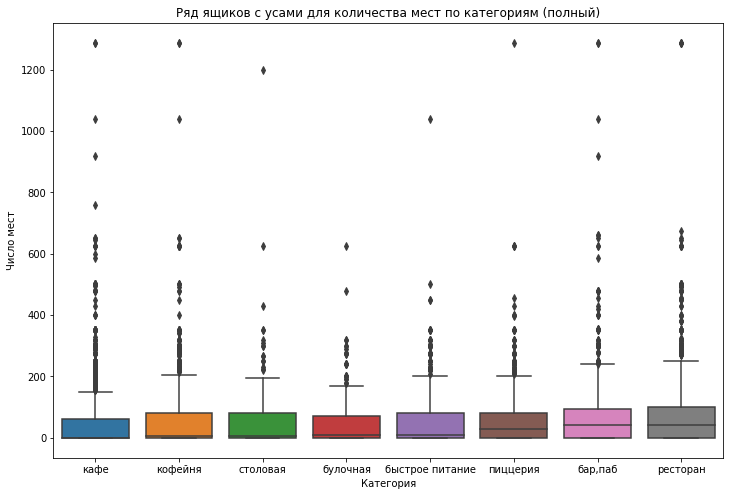

In [28]:
# Сортировка категорий по медиане 'seats'
sorted_categories = places.groupby('category')['seats'].median().sort_values().index

# Создание boxplot 
row_box_plots = sns.boxplot(x='category', y='seats', data=places, order=sorted_categories)
row_box_plots.set_title('Ряд ящиков с усами для количества мест по категориям (полный)')
row_box_plots.figure.set_size_inches(12, 8)

# Названия осей
row_box_plots.set_xlabel('Категория')  
row_box_plots.set_ylabel('Число мест')  

plt.show()

Графики показывают, что абсолютно в каждой категории многовероятно есть выбросы в данных по количеству мест (при этом выбросы уж очень резкие), поэтому с этим атрибутом нужно быть аккуратнее далее в работе: обязательно и необходимо использовать не параметрические методы или удалить выбросы из исследования перед использованием параметрических.

С наличием выбросов ситуация понятна, теперь более детально ознакомимся с изменчивостью данных:

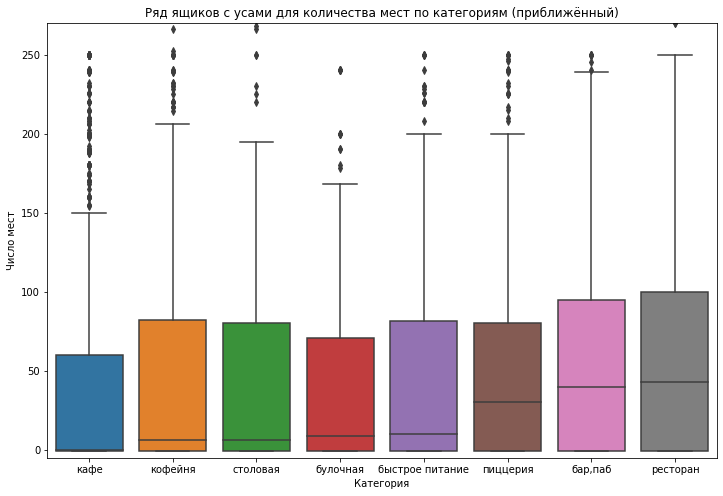

In [29]:
row_box_plots = sns.boxplot(x='category', y='seats', data=places, order=sorted_categories)
row_box_plots.set_title('Ряд ящиков с усами для количества мест по категориям (приближённый)')
row_box_plots.figure.set_size_inches(12, 8)

# Названия осей
row_box_plots.set_xlabel('Категория')  
row_box_plots.set_ylabel('Число мест')  

# Ограничение оси Y
plt.ylim(-5, 270)  

plt.show()

Можно заметить, что у всех категорий адекватная медиана, а вот у категории кафе она равна нулю: данная проблема возникла из-за огромного количества заглушек в категории, поэтому в следующей визуализации мы найдём медиану этой категории без учёта заглушек и отразим на графике.

Несмотря на проблему с медианой, наша визуализация хорошо демонстрирует разброс количества мест по каждой категории: наибольший разброс наблюдается у ресторанов по визуализации, но также стоит обратить внимание на кафе: из-за огромного количества пропусков (впоследствии заглушек) кажется, что разброс данных категории наименьший, но это не так: основная часть данных 'заглушена', стоит обратить внимание на количество выбросов. Выбросов в данной категории относительно больше всего, так что нужно понимать что наибольший разброс мест по категориям присущ кафе и ресторанам.

Построим столбчатую диаграмму распределения медианного количества мест: в данном случае заменим 'заглушку' на медиану в категории 'кафе', т.к. в ином случае медиана равна 0.

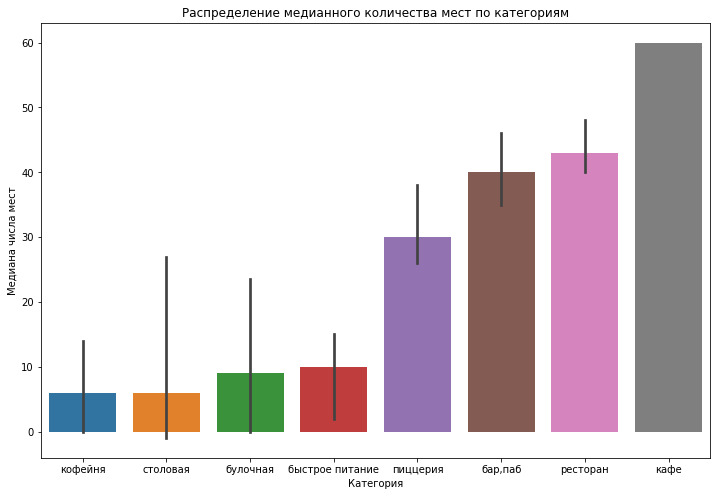

In [30]:

# Заменим 'заглушку' на медиану в категории кафе, т.к. в ином случае медиана равна 0
places.loc[(places['category'] == 'кафе') & (places['seats'] == -1), 'seats'] = places.query('category == "кафе" and seats != -1 and seats > 0')['seats'].median()

# Сортировка категорий по медиане 'seats'
sorted_categories = places.groupby('category')['seats'].median().sort_values().index

# Построем график
ax = sns.barplot(x='category', y='seats', data=places, estimator=median, order=sorted_categories)
ax.set_title('Распределение медианного количества мест по категориям')
ax.figure.set_size_inches(12, 8)  # Установка размера фигуры

# Названия осей
ax.set_xlabel('Категория')  
ax.set_ylabel('Медиана числа мест')  

plt.show()

На графике хорошо видно, что категории кафе, ресторан, бар(паб), пиццерия имеют медианное значение количества мест выше 30-и, остальные 4 категории имеют медиану ниже 15-и.

Таким образом, можно поделить категории на тривиально "многовместительные" (от 30-и мест по медиане) и "маловместительные" (до 15-и мест по медиане).


### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
<a id="33"></a>

In [31]:
chain_agg = places['chain'].value_counts()
chain_fig = go.Figure(data=[go.Pie(labels=chain_agg.index, values=chain_agg.values)])
chain_fig.update_layout(
    title="Круговая диаграмма сетевых и не сетевых заведений",
    legend=dict(title="Заведение является сетевым:")
)
chain_fig.show() 

- 38.1% заведений(или 3205 заведения) являются сетевыми;
- 61.9% заведений(или 5201 заведения) не являются сетевыми;

Заведений которые не являются сетевыми гораздо больше: на 23,8%.

### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.
<a id="34"></a>

In [32]:
# Найдём отношение сетевых заведений к общему числу по каждой категории
categ_agg = places.query('chain == True')['category'].value_counts() / places['category'].value_counts()
# Отсортируем для удобства восприятия
categ_agg = categ_agg.sort_values(ascending = False)

# Столбчатая диаграмма: индекс - категория, значение - количество
chain_fig_agg = px.bar(x=categ_agg.index, y=categ_agg.values, 
              title='Доля сетевых заведений по категориям')
# Развернём названия и переименуем оси
chain_fig_agg.update_xaxes(tickangle=45)
chain_fig_agg.update_layout(xaxis_title="Категория", 
                  yaxis_title="Доля сетевых")
chain_fig_agg.show()

Булочные, пиццерии и кофейни наиболее часто являются сетевыми: 

в нашем случае больше половины (50%) заведений этих категорий входят в сеть.

In [33]:
# Найдём абсолютное количество сетевых заведений по категориям
categ_agg = places.query('chain == True')['category'].value_counts()
# Отсортируем для удобства восприятия
categ_agg = categ_agg.sort_values(ascending = False)

# Столбчатая диаграмма: индекс - категория, значение - количество
chain_fig_agg = px.bar(x=categ_agg.index, y=categ_agg.values, 
              title='Количество сетевых заведений по категориям(в абсолютных значениях)')
# Развернём названия и переименуем оси
chain_fig_agg.update_xaxes(tickangle=45)
chain_fig_agg.update_layout(xaxis_title="Категория", 
                  yaxis_title="Количество заведений")
chain_fig_agg.show()

Кафе, рестораны и кофейни имеют большее количество сетевых точек по городу, относительно других категорий.

### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?
<a id="35"></a>

In [34]:
# Берём толбко сетевые заведения
chain_places = places.loc[places['chain'] == True]

# Находим количество заведений по названиям
top_15_chain = chain_places['name'].value_counts().head(15)

# Столбчатая диаграмма: индекс - категория, значение - количество
chain_fig_15 = px.bar(x=top_15_chain.index, y=top_15_chain.values, 
              title='Крупнейшие сети общественного питания в Москве')
# Развернём названия и переименуем оси
chain_fig_15.update_xaxes(tickangle=45)
chain_fig_15.update_layout(xaxis_title="Наименование сети", 
                  yaxis_title="Количество заведений")
chain_fig_15.show()

Топ-15 сетей общественного питания включает множество знакомых обычному человеку брендов: "Шоколадница", "Домино'с Пицца", "Додо Пицца", "One Price Coffee", "Яндекс Лавка" и т. д.

Большинство брендов из топа принадлежат категориям-лидерам по количеству сетевых заведений(в абсолютных или относительных величинах).

### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.
<a id="36"></a>

In [35]:
# Подсчитываем количество заведений в каждом округе по категориям
district_counts = places.groupby(['district', 'category'])['name'].count().reset_index().sort_values(by='name', ascending=False)

# Строим интерактивную гистограмму 
district_counts_fig = px.histogram(district_counts, x='district', y='name', color='category',
                   title='Количество заведений по районам и категориям',
                   labels={'district': 'Административный район', 'name': 'Количество заведений', 'category': 'Категория'})

# Меняем название оси у, чтобы избавиться от 'sum of'
district_counts_fig.update_layout(yaxis_title="Количество заведений")
district_counts_fig.show()

Всего у нас 9 административных районов: Центральный округ имеет заведений общественного питания минимум в 2 раза больше относительно любого другого района, соотношение долей по категориям в райнонах довольно схожее.

### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
<a id="37"></a>

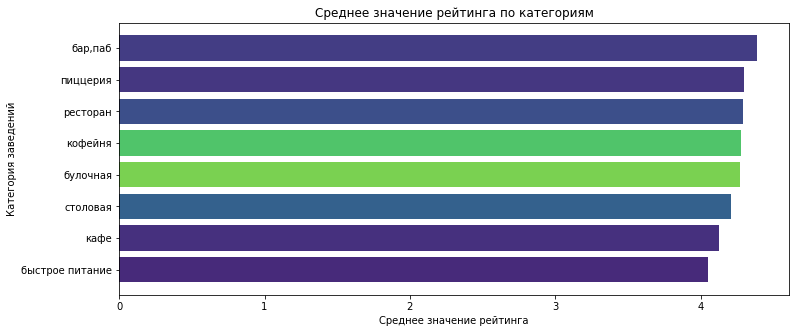

In [36]:
cat_rat_agg = places.groupby('category')['rating'].mean().sort_values()
plt.figure(figsize=(12, 5))  

# Генерируем случайные цвета для каждой категории
colors = [plt.cm.get_cmap('viridis')(random.random()) for _ in range(len(cat_rat_agg.index))]

plt.barh(cat_rat_agg.index, cat_rat_agg.values, color=colors)  

plt.xlabel('Среднее значение рейтинга')  
plt.ylabel('Категория заведений')  
plt.title('Среднее значение рейтинга по категориям')  
plt.show()

Грфик распределения средних рейтингов по категориям заведений говорит нам о том, что оценка средних рейтингов примерно похожа по всем категория: приблизительно от 4 до 4.5, что соответствует уровню - "хорошо".

### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).
<a id="38"></a>

Вместо среднего значения возьмём медиану, как и в прошлой задаче: преимущество медианы мы уже обговорили. 

In [37]:
rating_df = places.groupby('district', as_index=False)['rating'].agg('median')
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Интересно, что в самом сердце Москвы медианное значение рейтинга немного выше, чем в остальных районах.

### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
<a id="39"></a>

In [38]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.
<a id="40"></a>

In [39]:

# Находим количество заведений по названиям
top_15_street = places['street'].value_counts().head(15).index

# Группируем данные по улице и категории, подсчитывая количество заведений
street_category_counts = places.groupby(['street', 'category'])['name'].count().reset_index()

# Фильтруем данные, оставляя только топ-15 улиц
street_category_counts = street_category_counts[street_category_counts['street'].isin(top_15_street)]

# Сортируем данные по убыванию количества заведений
street_category_counts = street_category_counts.sort_values(by=['street', 'name'], ascending=[True, False])

# Строим интерактивную столбчатую диаграмму 
fig = px.histogram(street_category_counts, x="street", y="name", color="category",
                   title='Улицы-лидеры по наличию заведений общественного питания',
                   labels={'street': 'Наименование улицы', 'name': 'Количество заведений', 'category': 'Категория'},
                   category_orders={'street': top_15_street.tolist()})  # Задаем порядок улиц

# Настраиваем отображение при наведении курсора
fig.update_traces(
    hovertemplate='<b>%{x}</b><br>Категория: %{color}<br>Количество: %{y}',  # Hovertemplate для столбца
)

fig.show()


Наиболее масштабные по количеству заведений улицы: проспект Мира, Профсоюзная улица, проспект Вернадского и т.д. Этих улиц-лидеров по количеству заведений общепита объединяет то, что они выделяются на фоне других одним или несколькими значимыми факторами для постройки и открытия точки общественного питания: высокая плотность населения и пешеходного трафика, наличие транспортных узлов, равлекательный и торговые центры и другое.

Допустим, проспект Мира - это одна из основных магистралей, которая обслуживает северный сектор города и является одной из самых протяженных улиц Москвы. Длина данного торгового коридора составляет без малого 9 км, на Проспекте Мира расположено 224 дома. Улица проходит по территории Центрального и Северо-Восточного административных округов столицы и непосредственно по территории районов Мещанский, Марьина Роща, Алексеевский, Останкино, Ростокино, Свиблово.

(веб-источник про проспект Мира: https://miel.ru/press/prospekt-mira-teryaet-populyarnost-4844/).

### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?
<a id="41"></a>

In [40]:
# Предположим, что places - это DataFrame, который уже загружен
vc_street = places['street'].value_counts()
vc_street_1 = vc_street[vc_street == 1]

# Фильтруем места, где улица встречается только один раз
places_1 = places[places['street'].isin(vc_street_1.index)]

# москва_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places_1.apply(create_clusters, axis=1)

# выводим карту
m

Каких-то особенностей у единичных представителей общественного питания на одной улице по карте не выявлено, стоит взглянуть на масштаб таких заведений, доступность и рейтинг: возможно составить конкуренцию таким представителям очень сложно вот и на улице больше нет заведений.

In [41]:
# Построить гистограмму, показывающую распределение мест 
fig = px.histogram(places_1, x='seats', title='Гистограмма распределения мест (единичных на улице заведений)')
# Установите пределы для оси X
fig.update_layout(xaxis_range=[0, 100])
fig.show()

In [42]:
# Построить гистограмму, показывающую распределение мест 
fig = px.histogram(places, x='seats', title='Гистограмма распределения мест (общая)')
# Установите пределы для оси X
fig.update_layout(xaxis_range=[0, 100])
fig.show()

In [43]:
print(f'{places["seats"].median()} - медианное количество мест для всех заведений')
print(f'{places_1["seats"].median()} - медианное количество мест для единичных на улице заведений')

50.0 - медианное количество мест для всех заведений
30.0 - медианное количество мест для единичных на улице заведений


Сравнение медиан и гистограмм количества мест говорят, что единичные заведения не особо выделяются масштабами.

In [44]:
print(f'{places["rating"].median()} - медианный рейтинг всех заведений')
print(f'{places_1["rating"].median()} - медианный рейтинг для единичных на улице заведений')

4.3 - медианный рейтинг всех заведений
4.3 - медианный рейтинг для единичных на улице заведений


Медианный рейтинг таких заведений не отличается от генеральной совокупности.

In [45]:

print(f'{places["middle_avg_bill"].median()} - медианный средний чек всех заведений')
print(f'{places_1["middle_avg_bill"].median()} - медианный средний чек для единичных на улице заведений')
print()
print(f'{places["middle_avg_bill"].mean()} - усреднённый средний чек всех заведений')
print(f'{places_1["middle_avg_bill"].mean()} - усреднённый средний чек для единичных на улице заведений')

750.0 - медианный средний чек всех заведений
625.0 - медианный средний чек для единичных на улице заведений

958.0536678310575 - усреднённый средний чек всех заведений
959.8303030303031 - усреднённый средний чек для единичных на улице заведений


Явно сильных отличий не наблюдается: скорее всего единичными представителями заведения оказались случайно, найдём районы где их больше всего(им можно составить конкуренцию или открыть что-то смежное).

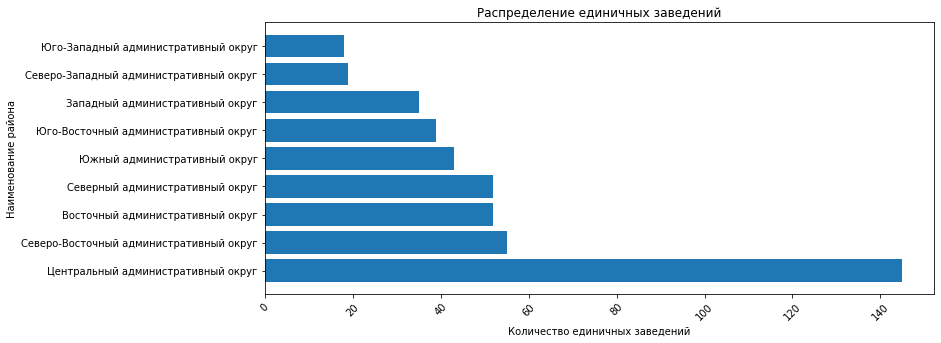

In [46]:
cat_rat_agg = places_1.groupby('district')['name'].count().sort_values(ascending=False)


plt.figure(figsize=(12, 5))  # Установка размера фигуры

plt.barh(cat_rat_agg.index, cat_rat_agg.values)  # Построение графика

plt.xlabel('Количество единичных заведений')  # Название оси X
plt.ylabel('Наименование района')  # Название оси Y

plt.title('Распределение единичных заведений')  # Заголовок

plt.xticks(rotation=45)  # Поворот меток оси X

plt.show()

Большинство таких заведений находится в центре, а значит даже в центральной части города есть шанс прибыльно открыть своё заведение, хотя стоит также учитывать иные факторы.

### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?
<a id="42"></a>

In [47]:
rating_df = places.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Центральная и западная часть Москвы имеет наиболее высокие медианные значения средних чеков: для центра города - это тривиальная ситуацию, а почему же западная часть имеет высокие цены? Уж если кто и может «меряться» с историческим центром Москвы своей престижностью, так это Западный административный округ. Элитарность его территорий начала складываться более полувека назад, когда на западе столицы стали появляться просторные кварталы для номенклатуры и дипломатов.

Веб-источник:https://nesiditsa.ru/city/moskva-zao#:~:text=%D0%9F%D0%BE%D0%BB%D0%BE%D0%B2%D0%B8%D0%BD%D1%83%20%D1%80%D0%B0%D0%B9%D0%BE%D0%BD%D0%B0%20%D0%BF%D0%BE%20%D0%BF%D0%B5%D1%80%D0%B8%D0%BC%D0%B5%D1%82%D1%80%D1%83%20%D0%BE%D0%B3%D0%B8%D0%B1%D0%B0%D0%B5%D1%82,%D1%81%D0%BF%D1%80%D0%BE%D1%81%D0%BE%D0%BC%2C%20%D0%BD%D0%B5%D1%81%D0%BC%D0%BE%D1%82%D1%80%D1%8F%20%D0%BD%D0%B0%20%D0%B4%D0%BE%D1%80%D0%BE%D0%B3%D0%BE%D0%B5%20%D0%B6%D0%B8%D0%BB%D1%8C%D0%B5.).

### Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.
<a id="43"></a>

Рассмотрим заведения с плохим рейтингом (ниже 2-х):

In [48]:
bad_rat_places = places[places['rating'] < 2]

Взлянем какие доли низкорейтинговых заведений по категориям:

In [49]:
# Найдём отношение низкорейтинговых заведений к общему числу по категориям
categ_agg = bad_rat_places['category'].value_counts() / places['category'].value_counts()
# Отсортируем для удобства восприятия
categ_agg = categ_agg.sort_values(ascending = False)

# Столбчатая диаграмма: индекс - категория, значение - отношение
chain_fig_agg = px.bar(x=categ_agg.index, y=categ_agg.values, 
              title='Отношение низкорейтинговых заведений к общему числу по категориям')
# Развернём названия и переименуем оси
chain_fig_agg.update_xaxes(tickangle=45)
chain_fig_agg.update_layout(xaxis_title="Категория", 
                  yaxis_title="Доля низкорейтинговых заведений")
chain_fig_agg.show()

Кафе, быстрое питание, столовая - категории в которых наиболее часто встречаются низкорейтинговые заведения. Кофейни и пиццерии имеют самые низкие доли низкорейтинговых заведений. 

Посмотрим какие районы являются лояльными, а какие не очень:

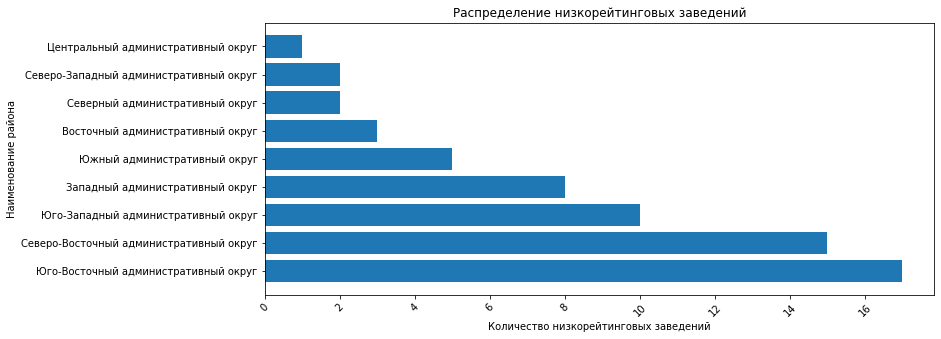

In [50]:
cat_rat_agg = bad_rat_places.groupby('district')['name'].count().sort_values(ascending=False)


plt.figure(figsize=(12, 5))  # Установка размера фигуры

plt.barh(cat_rat_agg.index, cat_rat_agg.values)  # Построение графика

plt.xlabel('Количество низкорейтинговых заведений')  # Название оси X
plt.ylabel('Наименование района')  # Название оси Y

plt.title('Распределение низкорейтинговых заведений')  # Заголовок

plt.xticks(rotation=45)  # Поворот меток оси X

plt.show()

График распределения низкорейтинговых заведений получен: Центральный административный округ имеет наименьшее количество низкорейтинговых заведений, а значит заведения в центре города стараются держать высокую клиентоориентированность.

### Соберите наблюдения по вопросам выше в один общий вывод.
<a id="44"></a>

- В Москве преобладают три категории заведений общественного питания: кафе, рестораны и кофейни, составляющие почти 3/4 рынка. Кафе, рестораны, бары и пиццерии относятся к многовместительным заведениям, а кофейни, точки быстрого питания, столовые и булочные – к маловместительным.

- 38,1% заведений в Москве — сетевые, при этом кофейни, пиццерии и булочные чаще всего являются сетевыми. Топ-15 сетей включает множество известных брендов, а также типовые наименования, не являющиеся единой сетью.

- Центральный округ превосходит все остальные по количеству заведений общественного питания почти в два раза, хотя соотношение категорий в районах довольно схожее. Средние рейтинги заведений в разных типах общепита отличаются незначительно, однако медианный рейтинг в центре чуть выше, чем в других районах.

- Центральная и западная части Москвы имеют самые высокие средние чеки. Кафе, быстрое питание и столовые чаще всего включают низкорейтинговые заведения, в то время как кофейни и пиццерии имеют наименьшую долю низкорейтинговых заведений.

- Центральный округ отличается наименьшим количеством низкорейтинговых заведений, что свидетельствует о высоком уровне клиентоориентированности заведений в этом районе.

## Детализируем исследование: открытие кофейни
<a id="5"></a>

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
<a id="51"></a>

In [51]:
print(f'Количество кофеен в датасете: {len(places[places["category"] == "кофейня"])}')
print(f'Доля кофеен в датасете: {round(len(places[places["category"] == "кофейня"]) / len(places["category"]), 2)}')

Количество кофеен в датасете: 1413
Доля кофеен в датасете: 0.17


Распределение кофеен по районам:

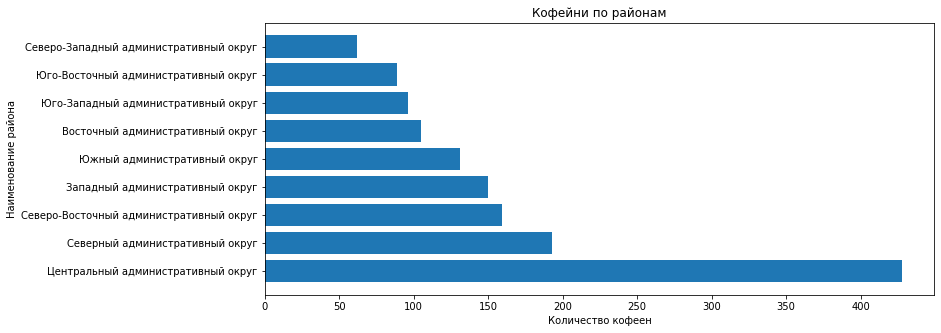

In [52]:
only_coffee = places.loc[places['category'] == 'кофейня'] # записи с кофейнями
only_coffee_agg = only_coffee.groupby('district')['name'].count().sort_values(ascending=False) # 


plt.figure(figsize=(12, 5))  # установка размера графика

plt.barh(only_coffee_agg.index, only_coffee_agg.values) 

# Переименование осей и названия графика
plt.xlabel('Количество кофеен')  
plt.ylabel('Наименование района')  
plt.title('Кофейни по районам')  

plt.show()

Больше всего кофеен в Центральном административном округе (более 400), далее округа имеют объёмы кофеен как минимум в 2 раза меньше: Северный административный округ имеет около 190 заведений, Северо-Восточный около 160 и т.д.

Интересно, что Западный и Центральный административные округа похожи по медианам средних чеков по всем категориям (они являются лидерами), но конкуренция в этих районах сильно разниться в категории "кофейня": цены в районах схожи, конкуренция в Центральном районе выше, по этим критериям приоритет можно отдать Западному району, но стоит также постараться учитывать другие факторы: проходимость и другие. 

Взглянем на медианные значения средних чеков на карте только по категории "кофейня":

In [53]:
avg_bill_df = only_coffee.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек кофеен по районам',
).add_to(m)

# выводим карту
m

Западный район имеет более высокие медианные значения средних чеков, относительно всех остальных (даже Центрального) и при этом умеренную конкуренцию в категории.

### Есть ли круглосуточные кофейни?
<a id="52"></a>

In [54]:
if any((places['category'] == 'кофейня') & (places['is_24_7'] == True)) == True:
    print('Круглосуточные кофейни присутствуют в нашем датафрейме (в Москве есть кофейни 24/7).')
    count_coffee_24_7 = len(places[(places['category'] == 'кофейня') & (places['is_24_7'] == True)]['name'])
    print('Количество круглосуточных кофеен:', count_coffee_24_7)
else:
    print('Круглосуточных кофейн нет в нашем датафрейме.')

Круглосуточные кофейни присутствуют в нашем датафрейме (в Москве есть кофейни 24/7).
Количество круглосуточных кофеен: 59


### Какие у кофеен рейтинги? Как они распределяются по районам?
<a id="53"></a>

Посмотрим краткую сводку описательных статистик рейтинга кофеен:

In [55]:
only_coffee['rating'].describe()

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Среднее и медиана сильно не отличаются: 4.28 - 4.3, минимальное и максимальное значения допустимые, выбросов нет.

Медианный/средний рейтинг категории довольно высокий.

Распределение рейтингов кофеен по районам:

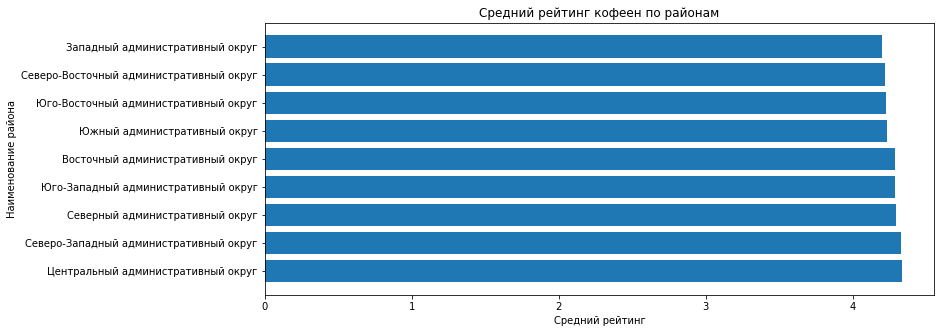

In [56]:
only_coffee = places.loc[places['category'] == 'кофейня'] # записи с кофейнями
only_coffee_agg = only_coffee.groupby('district')['rating'].mean().sort_values(ascending=False) # 


plt.figure(figsize=(12, 5))  # установка размера графика

plt.barh(only_coffee_agg.index, only_coffee_agg.values) 

# Переименование осей и названия графика
plt.xlabel('Средний рейтинг')  
plt.ylabel('Наименование района')  
plt.title('Средний рейтинг кофеен по районам')  

plt.show()

Среднее значение рейтинга по районам сильных различий не имеет, правда Западный округ имеет оценку немного ниже иных районов, что не столь значительно если вспомнить преимущества.

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
<a id="54"></a>

Если мы рассматриваем стоимость чашки капучино на этапе открытия заведения, то нужно понимать что существуют конкуренты, которые уже успели зарекомендовать себя на рынке и имеют клиентскую базу, которую необходимо как-то переманить к себе.

Тривиально быстро завоевать доверия у клиентов можно за счёт хорошего обслуживания и цен ниже рынка, поэтому для того чтобы рассчитать стоимость капучино на старте нужно найти медианную стоимость чашки капучино в конкретном районе и  немного её снизить: желательно найти эластичность спроса и понять как быстро нарастить базу клиентов и при этом ещё и заработать.

In [57]:

median_coffee_cup = only_coffee.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False)

# Вычисляем 1-й квартиль
first_quartile_coffee_cup = only_coffee.groupby('district')['middle_coffee_cup'].quantile(0.25).sort_values(ascending=False)

# Преобразуем Series в DataFrame
median_coffee_cup_df = pd.DataFrame({
    'middle_coffee_cup': median_coffee_cup,
    'first_quartile': first_quartile_coffee_cup
})

# Применяем градиент к DataFrame
median_coffee_cup_df.style.background_gradient(cmap='viridis', subset=['middle_coffee_cup', 'first_quartile'])

,middle_coffee_cup,first_quartile
district,,
Восточный административный округ,135.000000,106.250000
Западный административный округ,189.000000,130.000000
Северный административный округ,159.000000,133.000000
Северо-Восточный административный округ,162.500000,123.000000
Северо-Западный административный округ,165.000000,124.000000
Центральный административный округ,190.000000,139.000000
Юго-Восточный административный округ,147.500000,112.500000
Юго-Западный административный округ,198.000000,129.000000
Южный административный округ,150.000000,107.500000


Мы можем использовать таблицу с данными по цене капучино в каждом районе, чтобы определить диапазон цен, который, предположительно, является наиболее привлекательным для покупателей. Этот диапазон будет лежать между 1-м квартилем (25-й процентиль) и медианой (50-й процентиль) цен, желательно всё же найти точку 'лояльности' к покупки клиента исходя из эластичности спроса, возможно диапозон получится иным.

## Подготовка презентации
<a id="6"></a>

- Откроем презентацию в Jupiter:

In [58]:
from IPython.display import IFrame
IFrame("Исследование рынка заведений общественного питания Москвы 2.pdf", width=800, height=600)

- ссылка на презентацию (Google Диск): 

https://drive.google.com/file/d/1mcyrC2Tjp1A6jY7YQPC2mToy7RGgeSLw/view?usp=sharing